# A notebook for creating sc graph animations with glimpses

In [1]:
import napari
from cellpose import models
from octopuslite import utils, tile
import numpy as np
import os

def view(img):
    return napari.Viewer().add_image(img)
from napari_animation import Animation
from tqdm.auto import tqdm

import btrack
import dask.array as da

from skimage.transform import rescale, resize, downscale_local_mean

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_theme(style="ticks")
sns.set_palette("Spectral")

### Load all metadata

In [2]:
image_dir = '/mnt/DATA/sandbox/pierre_live_cell_data/outputs/Replication_IPSDM_GFP/Images/'
metadata_fn = '/mnt/DATA/sandbox/pierre_live_cell_data/outputs/Replication_IPSDM_GFP/Index.idx.xml'
metadata = utils.read_harmony_metadata(metadata_fn)
metadata_path = '/mnt/DATA/sandbox/pierre_live_cell_data/outputs/Replication_IPSDM_GFP/Assaylayout/20210602_Live_cell_IPSDMGFP_ATB.xml'
assay_layout = utils.read_harmony_metadata(metadata_path, assay_layout=True)
assay_layout

Reading metadata XML file...


Extracting HarmonyV5 metadata:   0%|          | 0/113400 [00:00<?, ?it/s]

Extracting metadata complete!
Reading metadata XML file...
Extracting metadata complete!


Strain Compound Concentration ConcentrationEC
3 4    RD1     CTRL             0             EC0
  5     WT     CTRL             0             EC0
  6     WT      PZA            60            EC50
  7     WT      RIF           0.1            EC50
  8     WT      INH          0.04            EC50
  9     WT      BDQ          0.02            EC50
4 4    RD1     CTRL             0             EC0
  5     WT     CTRL             0             EC0
  6     WT      PZA            60            EC50
  7     WT      RIF           0.1            EC50
  8     WT      INH          0.04            EC50
  9     WT      BDQ          0.02            EC50
5 4    RD1     CTRL             0             EC0
  5     WT     CTRL             0             EC0
  6     WT      PZA           400            EC99
  7     WT      RIF             2            EC99
  8     WT      INH             2            EC99
  9     WT      BDQ           2.5            EC99
6 4    RD1     CTRL             0             EC0
  5     WT     CTRL             0             EC0
  6     WT      PZA           400            EC99
  7     WT      RIF             2            EC99
  8     WT      INH             2            EC99
  9     WT      BDQ           2.5            EC99

# Iteratively load all tracks

In [3]:
tracks_dict = dict()
N_cell_t0_dict = dict()
for (row, column), info in tqdm(assay_layout.iterrows(), 
                                desc = 'Progress through positions',
                                total = len(assay_layout)):

    with btrack.dataio.HDF5FileHandler(
                                        f"/mnt/DATA/macrohet/segmentation/tracks_objs/({row},{column})_tracks_rescaled.h5", 
                                        'r', 
                                        obj_type = 'obj_type_1', 
                                        ) as hdf: 
                                        tracks = hdf.tracks
                                        objs = hdf.objects
    N_cell_t0_dict[(row, column)] = len([obj for obj in objs if obj.t == 0])
    tracks_dict[(row, column)] = tracks

Progress through positions:   0%|          | 0/24 [00:00<?, ?it/s]

[INFO][2023/03/02 08:54:26 AM] Opening HDF file: /mnt/DATA/macrohet/segmentation/tracks_objs/(3,4)_tracks_rescaled.h5...
[INFO][2023/03/02 08:54:26 AM] Loading tracks/obj_type_1
[INFO][2023/03/02 08:54:26 AM] Loading LBEP/obj_type_1
[INFO][2023/03/02 08:54:26 AM] Loading objects/obj_type_1 (29079, 5) (29079 filtered: None)
[INFO][2023/03/02 08:54:27 AM] Loading objects/obj_type_1 (29079, 5) (29079 filtered: None)
[INFO][2023/03/02 08:54:27 AM] Closing HDF file: /mnt/DATA/macrohet/segmentation/tracks_objs/(3,4)_tracks_rescaled.h5
[INFO][2023/03/02 08:54:27 AM] Opening HDF file: /mnt/DATA/macrohet/segmentation/tracks_objs/(3,5)_tracks_rescaled.h5...
[INFO][2023/03/02 08:54:27 AM] Loading tracks/obj_type_1
[INFO][2023/03/02 08:54:27 AM] Loading LBEP/obj_type_1
[INFO][2023/03/02 08:54:27 AM] Loading objects/obj_type_1 (30240, 5) (30240 filtered: None)
[INFO][2023/03/02 08:54:28 AM] Loading objects/obj_type_1 (30240, 5) (30240 filtered: None)
[INFO][2023/03/02 08:54:28 AM] Closing HDF file:

[INFO][2023/03/02 08:54:47 AM] Loading LBEP/obj_type_1
[INFO][2023/03/02 08:54:47 AM] Loading objects/obj_type_1 (32090, 5) (32090 filtered: None)
[INFO][2023/03/02 08:54:48 AM] Loading objects/obj_type_1 (32090, 5) (32090 filtered: None)
[INFO][2023/03/02 08:54:50 AM] Closing HDF file: /mnt/DATA/macrohet/segmentation/tracks_objs/(5,7)_tracks_rescaled.h5
[INFO][2023/03/02 08:54:50 AM] Opening HDF file: /mnt/DATA/macrohet/segmentation/tracks_objs/(5,8)_tracks_rescaled.h5...
[INFO][2023/03/02 08:54:50 AM] Loading tracks/obj_type_1
[INFO][2023/03/02 08:54:50 AM] Loading LBEP/obj_type_1
[INFO][2023/03/02 08:54:50 AM] Loading objects/obj_type_1 (30332, 5) (30332 filtered: None)
[INFO][2023/03/02 08:54:50 AM] Loading objects/obj_type_1 (30332, 5) (30332 filtered: None)
[INFO][2023/03/02 08:54:51 AM] Closing HDF file: /mnt/DATA/macrohet/segmentation/tracks_objs/(5,8)_tracks_rescaled.h5
[INFO][2023/03/02 08:54:51 AM] Opening HDF file: /mnt/DATA/macrohet/segmentation/tracks_objs/(5,9)_tracks_re

# Extracting other params

In [9]:
def msd_calc(x1, y1, x2, y2):
    return np.sqrt((x1-x2)**2+(y1-y2)**2)

# Creating glimpses

Need to redefine the df to include xy coords

In [8]:
dfs = list()
filtered_tracks = dict()
for key in tracks_dict.keys():
    filtered_tracks[key] = [track for track in tracks_dict[key] if len(track) == 75]
    for track in filtered_tracks[key]:
        info = assay_layout.loc[key]
        strain = info['Strain']
        comp = info['Compound']
        conc = info['ConcentrationEC']
        d = {'Time (hours)':track['t'], 'x':track['x'],
             'y':track['y'],'Area':track['area'], 
     'Intracellular Mtb content':track['mean_intensity-1'],
     'Macroph. GFP expression':track['mean_intensity-0'],
     'Eccentricity':np.sqrt(1-((track['minor_axis_length']**2)/(track['major_axis_length']**2))),
     'MSD': [msd_calc(track['x'][i-1], track['y'][i-1], 
                      track['x'][i], track['y'][i]) 
               if i != 0 else 0
             for i in range(0, len(track))],
     'Strain':[strain for i in range(len(track['t']))], 
     'Compound':[comp for i in range(len(track['t']))], 
     'Concentration':[conc for i in range(len(track['t']))], 
     'Cell ID':[track.ID for i in range(len(track['t']))],
     'Acquisition ID':[key for i in range(len(track['t']))]}
        dfs.append(pd.DataFrame(d))
df = pd.concat(dfs, ignore_index=True)

In [10]:
df

,Time (hours),x,y,Area,Intracellular Mtb content,Macroph. GFP expression,Eccentricity,MSD,Strain,Compound,Concentration,Cell ID,Acquisition ID
0,0,1169.847412,13.893421,760.0,0.005136,0.014705,0.809516,0.000000,RD1,CTRL,EC0,343,"(3, 4)"
1,1,1172.826538,14.674929,1049.0,0.005121,0.013235,0.843927,3.079926,RD1,CTRL,EC0,343,"(3, 4)"
2,2,1174.588867,14.375803,934.0,0.005116,0.013899,0.719524,1.787535,RD1,CTRL,EC0,343,"(3, 4)"
3,3,1175.250610,12.160207,774.0,0.005094,0.013428,0.739700,2.312308,RD1,CTRL,EC0,343,"(3, 4)"
4,4,1180.553955,9.897770,538.0,0.005071,0.012774,0.761300,5.765768,RD1,CTRL,EC0,343,"(3, 4)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
81520,70,559.663025,1177.240234,3018.0,0.005635,0.024949,0.698306,3.245095,WT,BDQ,EC99,155,"(6, 9)"
81521,71,556.457581,1178.115601,2863.0,0.005609,0.024090,0.716728,3.322821,WT,BDQ,EC99,155,"(6, 9)"
81522,72,559.905823,1178.514648,3047.0,0.005600,0.022092,0.789115,3.471255,WT,BDQ,EC99,155,"(6, 9)"
81523,73,565.014221,1180.512939,2737.0,0.005606,0.021206,0.822009,5.485335,WT,BDQ,EC99,155,"(6, 9)"


In [11]:
assay_layout

Strain Compound Concentration ConcentrationEC
3 4    RD1     CTRL             0             EC0
  5     WT     CTRL             0             EC0
  6     WT      PZA            60            EC50
  7     WT      RIF           0.1            EC50
  8     WT      INH          0.04            EC50
  9     WT      BDQ          0.02            EC50
4 4    RD1     CTRL             0             EC0
  5     WT     CTRL             0             EC0
  6     WT      PZA            60            EC50
  7     WT      RIF           0.1            EC50
  8     WT      INH          0.04            EC50
  9     WT      BDQ          0.02            EC50
5 4    RD1     CTRL             0             EC0
  5     WT     CTRL             0             EC0
  6     WT      PZA           400            EC99
  7     WT      RIF             2            EC99
  8     WT      INH             2            EC99
  9     WT      BDQ           2.5            EC99
6 4    RD1     CTRL             0             EC0
  5     WT     CTRL             0             EC0
  6     WT      PZA           400            EC99
  7     WT      RIF             2            EC99
  8     WT      INH             2            EC99
  9     WT      BDQ           2.5            EC99

In [12]:
## picking EC99 PZA as example 
tracks_df = df[df['Acquisition ID']==(3,5)]

#### pull corresponding images

In [13]:
row, column = tracks_df['Acquisition ID'].iloc[0]
images = tile.compile_mosaic(
                             image_dir, 
                             metadata, 
                             row, 
                             column, 
                             set_plane = 'sum_proj',
                             ).astype(np.uint16)

In [14]:
images

,Array,Chunk
Bytes,10.22 GiB,15.50 MiB
Shape,"(75, 2, 6048, 6048)","(1, 2, 2016, 2016)"
Count,16875 Tasks,675 Chunks
Type,uint16,numpy.ndarray


In [15]:
tracks_df

,Time (hours),x,y,Area,Intracellular Mtb content,Macroph. GFP expression,Eccentricity,MSD,Strain,Compound,Concentration,Cell ID,Acquisition ID
4050,0,214.715118,649.776428,4602.0,0.005709,0.019985,0.630087,0.000000,WT,CTRL,EC0,311,"(3, 5)"
4051,1,214.955872,648.901794,4329.0,0.005699,0.023402,0.777214,0.907164,WT,CTRL,EC0,311,"(3, 5)"
4052,2,223.674240,650.713928,3877.0,0.005765,0.031596,0.599604,8.904705,WT,CTRL,EC0,311,"(3, 5)"
4053,3,221.003372,652.696777,4449.0,0.005688,0.020448,0.548114,3.326443,WT,CTRL,EC0,311,"(3, 5)"
4054,4,219.889526,644.160156,4571.0,0.005681,0.017730,0.519863,8.608981,WT,CTRL,EC0,311,"(3, 5)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8845,70,232.521423,1050.394287,3640.0,0.005843,0.036635,0.980228,9.251238,WT,CTRL,EC0,118,"(3, 5)"
8846,71,233.531189,1046.637085,3174.0,0.005872,0.038989,0.978308,3.890526,WT,CTRL,EC0,118,"(3, 5)"
8847,72,233.076035,1049.535522,2788.0,0.005860,0.037660,0.982123,2.933957,WT,CTRL,EC0,118,"(3, 5)"
8848,73,232.424057,1049.874878,3476.0,0.005877,0.040134,0.982669,0.735008,WT,CTRL,EC0,118,"(3, 5)"


In [16]:
tracks_df.loc[tracks_df['Intracellular Mtb content'].idxmax()]

Time (hours)                         66
x                            896.994812
y                            720.542053
Area                              773.0
Intracellular Mtb content      0.011608
Macroph. GFP expression        0.015065
Eccentricity                   0.751141
MSD                            2.188282
Strain                               WT
Compound                           CTRL
Concentration                       EC0
Cell ID                              84
Acquisition ID                   (3, 5)
Name: 7191, dtype: object

In [17]:
tracks_df.loc[tracks_df['Intracellular Mtb content'].idxmin()]

Time (hours)                           4
x                            1186.203857
y                              53.320705
Area                              1584.0
Intracellular Mtb content       0.005072
Macroph. GFP expression          0.00903
Eccentricity                    0.901029
MSD                             2.058535
Strain                                WT
Compound                            CTRL
Concentration                        EC0
Cell ID                              304
Acquisition ID                    (3, 5)
Name: 4204, dtype: object

### Removing a track from the df because it is broken

In [60]:
tracks_df.drop(tracks_df[tracks_df['Cell ID'] == 84].index, inplace = True)

In [61]:
tracks_df.loc[tracks_df['Intracellular Mtb content'].idxmax()]

Time (hours)                         21
x                            595.605286
y                             13.226989
Area                             1282.0
Intracellular Mtb content      0.011354
Macroph. GFP expression        0.025677
Eccentricity                   0.835656
MSD                            3.132651
Strain                               WT
Compound                           CTRL
Concentration                       EC0
Cell ID                             293
Acquisition ID                   (3, 5)
Name: 4296, dtype: object

## Select one cell as a seperate df

In [62]:
sc_df = tracks_df[tracks_df['Cell ID']==293]
ID = list(sc_df['Cell ID'])[0]
acq_ID = list(sc_df['Acquisition ID'])[0]

## Make series of glimpses

In [63]:
### glimpse size
size = 500
### resized images
scale = 6048/1200

In [64]:
%%time
glimpse_stack = list()
for row in tqdm(sc_df.iterrows(), total = len(sc_df)):
    time, x, y = row[1]['Time (hours)'], row[1]['y'], row[1]['x']
    frame = images[time,...]
    x1, y1 = x*scale, y*scale
#     x1, x2, y1, y2 = x1*scale, x2*scale, y1*scale, y2*scale
#     x1, x2, y1, y2 = x1, x2+size, y1, y2+size
    x1, x2, y1, y2 = x1, x1+size, y1, y1+size
    frame = da.pad(frame, [(0, 0), (size/2, size/2), (size/2, size/2)], 'constant', constant_values = 0) 
    glimpse = frame[..., int(x1): int(x2), int(y1): int(y2)]# frame[..., int(x1): int(x2), int(y1): int(y2)]

    glimpse_stack.append(glimpse)
glimpse_stack = np.stack(glimpse_stack, axis = 1)
# #     fn = 'cell_ID_' + str(cell.ID) + '_channel' + channel + '_t{}_age{}.tif'.format(i, age)
#     ### glimpse output
#     imsave(os.path.join(output_ch_dir, fn), glimpse) 
# print('cell ID',cell.ID, 'glimpse saved')

  0%|          | 0/75 [00:00<?, ?it/s]

CPU times: user 668 ms, sys: 24.7 ms, total: 692 ms
Wall time: 670 ms


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/dask/array/core.py:1744: PerformanceWarning: Increasing number of chunks by factor of 27
  return da_func(*args, **kwargs)


In [65]:
%%time
glimpse_stack = glimpse_stack.compute().compute()

CPU times: user 27min 56s, sys: 1min 10s, total: 29min 6s
Wall time: 2min 9s


In [66]:
def update_slider(event):
    # only trigger if update comes from first axis (optional)
        #ind_lambda = viewer.dims.indices[0]
    time = viewer.dims.current_step[0]
    viewer.text_overlay.text = f"{time:1.1f} hours"
text_size = 18
scale = [1.4949402023919043e-07, 1.4949402023919043e-07]

In [68]:
viewer = napari.Viewer()
viewer.add_image(glimpse_stack, channel_axis = 0, colormap= ['green', 'magenta'], scale = scale
                )
viewer.theme = 'light'
viewer.scale_bar.visible = True
viewer.scale_bar.unit = 'm'
viewer.scale_bar.font_size = text_size
viewer.text_overlay.visible = True
viewer.text_overlay.color = 'black'
viewer.text_overlay.position = 'bottom_left'
viewer.text_overlay.font_size = text_size
viewer.dims.events.current_step.connect(update_slider)


/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


<function __main__.update_slider(event)>

In [69]:
zoom = viewer.camera.zoom
cam_coords = viewer.camera.center

In [70]:
os.mkdir(f'/home/dayn/Videos/tb_mp4s/glimpses/pierre_data/{acq_ID}/')

FileExistsError: [Errno 17] File exists: '/home/dayn/Videos/tb_mp4s/glimpses/pierre_data/(3, 5)/'

In [71]:
fn = f'/home/dayn/Videos/tb_mp4s/glimpses/pierre_data/{acq_ID}/{ID}/glimpse_{ID}.mp4'
if not os.path.exists(os.path.dirname(fn)):
    os.mkdir(os.path.dirname(fn))

In [72]:
viewer = napari.Viewer()
viewer.add_image(glimpse_stack, channel_axis = 0, colormap= ['green', 'magenta'], scale = scale
                )
viewer.theme = 'light'
viewer.scale_bar.visible = True
viewer.scale_bar.unit = 'm'
viewer.scale_bar.font_size = text_size
viewer.text_overlay.visible = True
viewer.text_overlay.color = 'black'
viewer.text_overlay.position = 'bottom_left'
viewer.text_overlay.font_size = text_size
viewer.dims.events.current_step.connect(update_slider)

animation = Animation(viewer)
viewer.update_console({'animation': animation})
# viewer.camera.center = (0, 0, 3024, 3024)
viewer.dims.current_step = (0, cam_coords[-2], cam_coords[-1])
viewer.camera.zoom = zoom*0.75
animation.capture_keyframe(steps = 100)
viewer.dims.current_step = (74.0,  cam_coords[-2], cam_coords[-1])
animation.capture_keyframe(steps = 100)

animation.animate(fn, 
                  canvas_only=True,
                  fps = 5,
                  quality = 9)
# viewer.close()

/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Rendering frames...


100%|█████████████████████████████████████████| 101/101 [00:03<00:00, 27.26it/s]


In [73]:
zoom = viewer.camera.zoom
cam_coords = viewer.camera.center

In [74]:
from skimage.io import imsave

In [75]:
os.mkdir(os.path.dirname(fn)+f'/{ID}_glimpse_seq')

In [76]:
viewer = napari.Viewer()
viewer.add_image(glimpse_stack, channel_axis = 0, colormap= ['green', 'magenta'], scale = scale
                )
viewer.theme = 'light'
viewer.scale_bar.visible = True
viewer.scale_bar.unit = 'm'
viewer.scale_bar.font_size = text_size
viewer.text_overlay.visible = True
viewer.text_overlay.color = 'black'
viewer.text_overlay.position = 'bottom_left'
viewer.text_overlay.font_size = text_size
viewer.dims.events.current_step.connect(update_slider)

for t in tqdm(list(sc_df['Time (hours)'])):
    viewer.dims.current_step = (t, cam_coords[-2], cam_coords[-1])
    viewer.camera.zoom = zoom*0.85
    new_fn = os.path.dirname(fn)+f'/{ID}_glimpse_seq/t_{t}.tiff'
    imsave(new_fn, viewer.screenshot())

/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


  0%|          | 0/75 [00:00<?, ?it/s]

# Custom way of plotting animated cells

In [46]:
from scipy.ndimage.filters import gaussian_filter1d
from skimage.io import imread

/tmp/ipykernel_135737/3066574550.py:1: DeprecationWarning: Please use `gaussian_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter1d


In [77]:
os.mkdir(os.path.dirname(new_fn).replace('_seq', f'_animated_graph/'))

  0%|          | 0/75 [00:00<?, ?it/s]

/tmp/ipykernel_135737/442718586.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8), gridspec_kw={'width_ratios': [1.15, 1]})


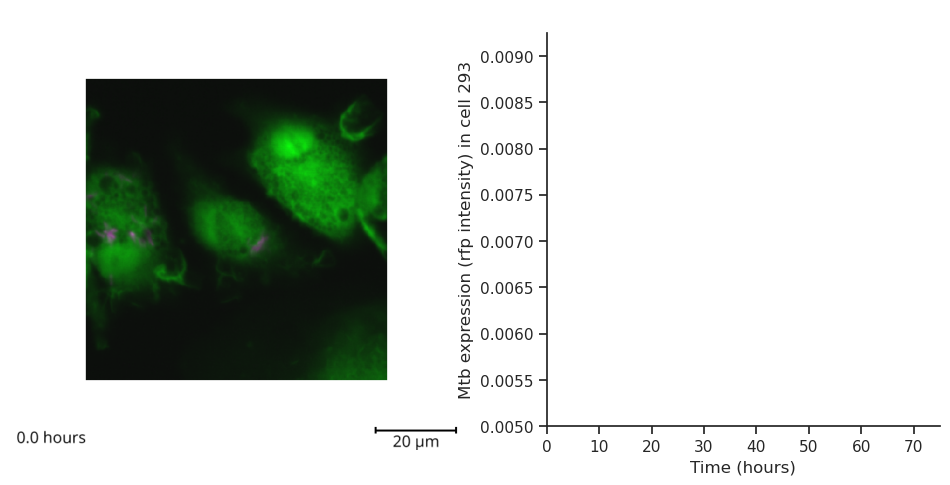

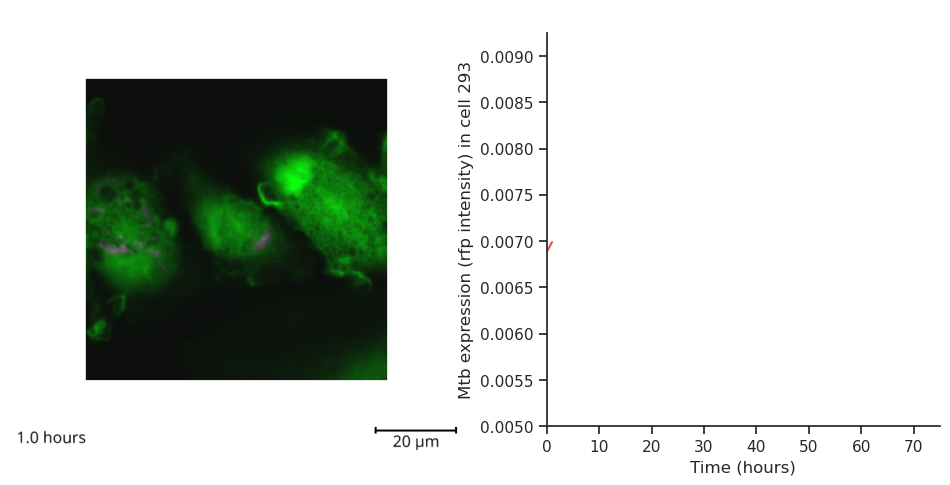

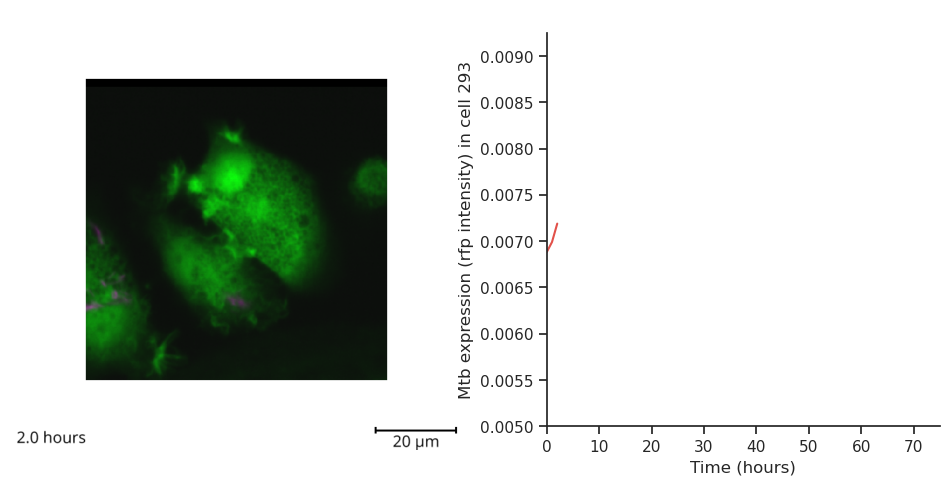

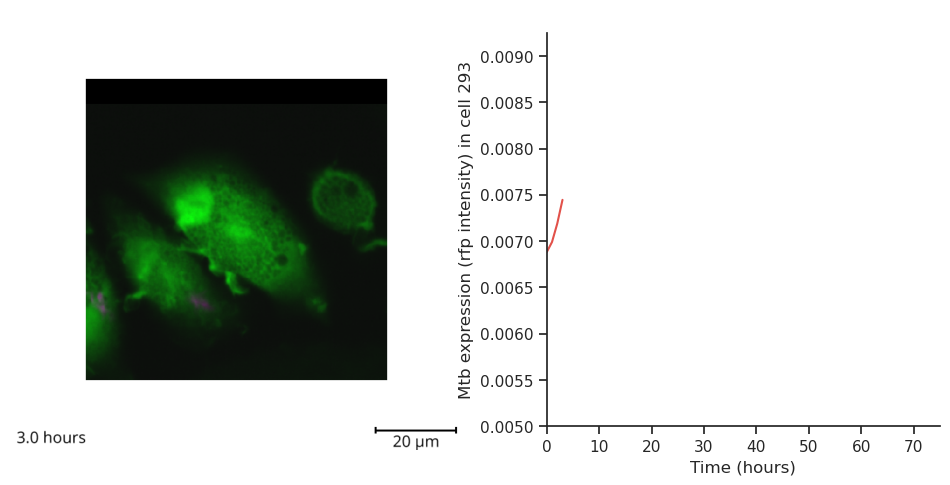

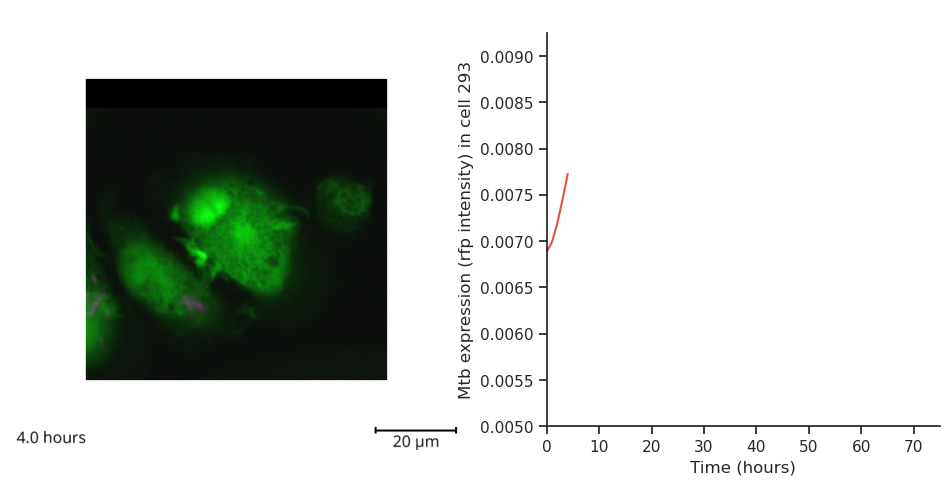

...

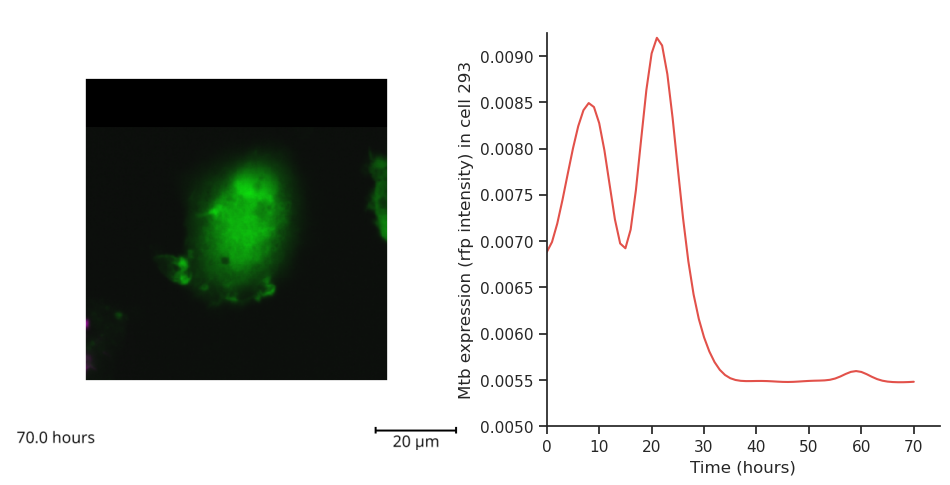

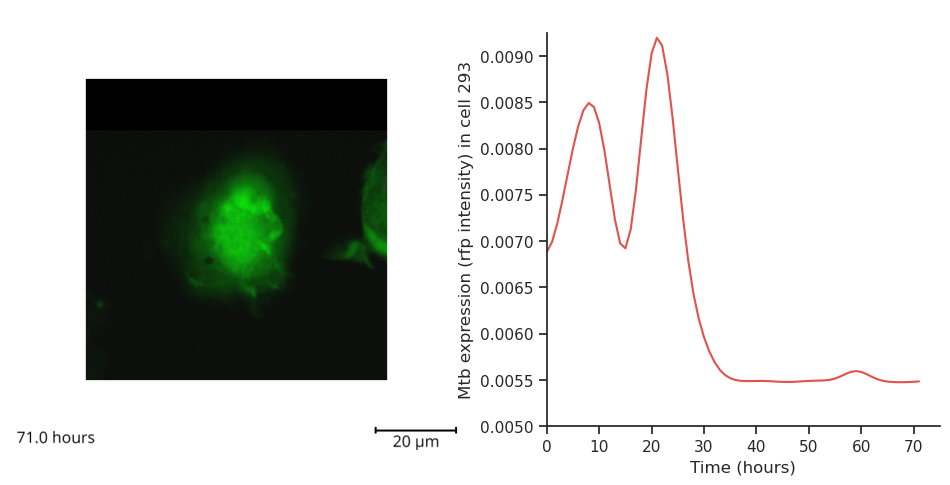

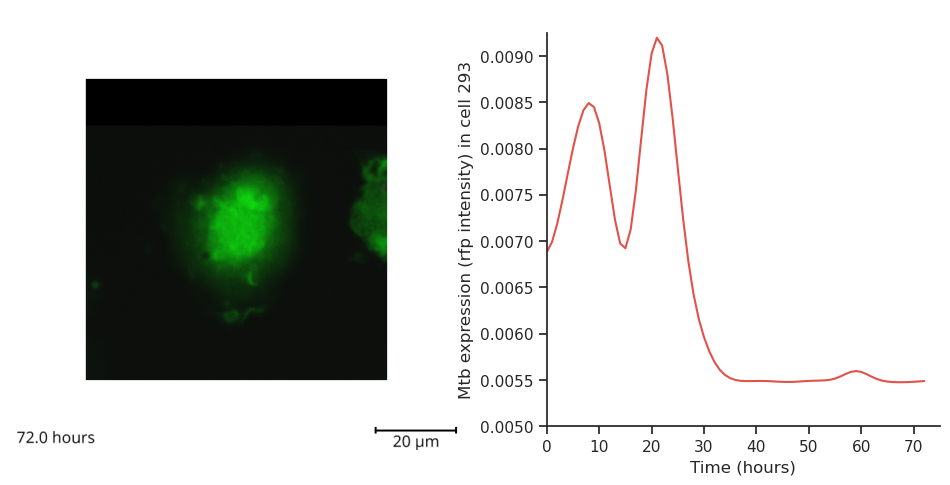

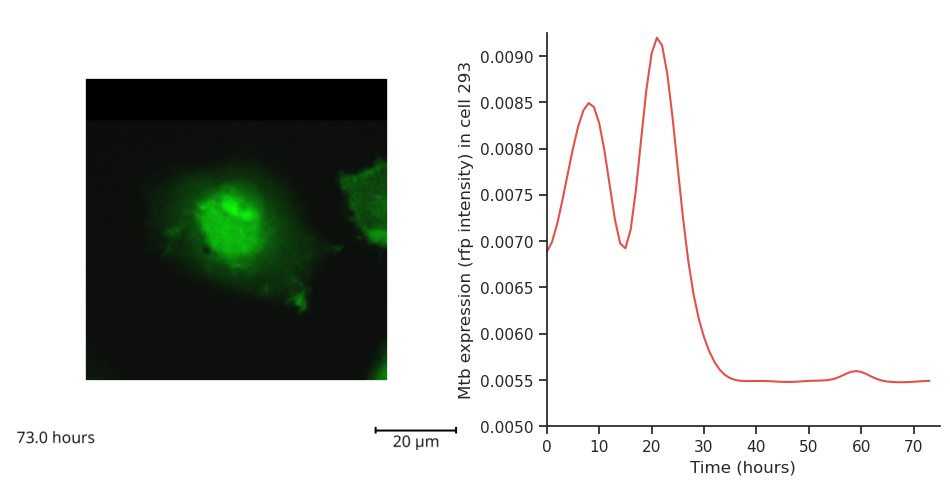

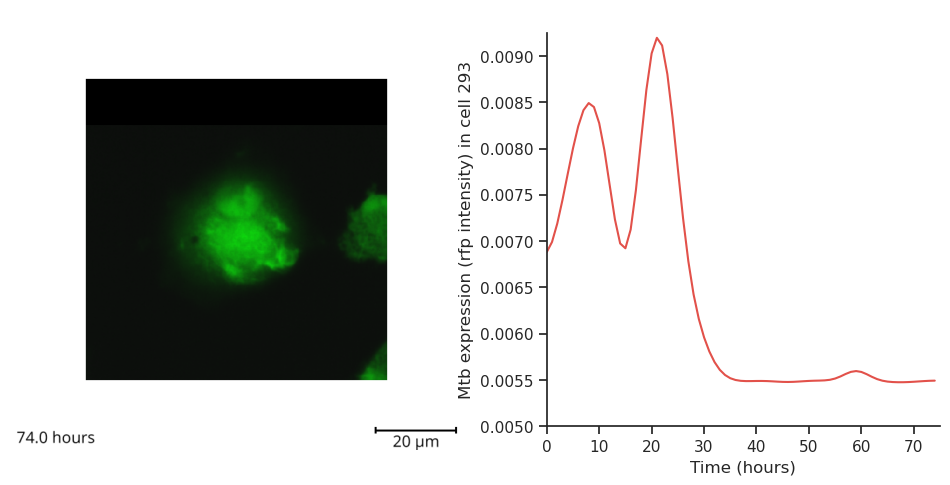

In [85]:
y = list(sc_df['Intracellular Mtb content'].interpolate())
y = gaussian_filter1d(y, sigma=2.5)
for n, row in tqdm(enumerate(sc_df.iterrows()), total = len(sc_df)):
#     x = list(cell_ID_431['Time'].iloc[0:n+1])
#     y = list(cell_ID_431['Intracellular Mtb content'].iloc[0:n+1].interpolate())
#     y = gaussian_filter1d(y, sigma=2.5)
    x = list(sc_df['Time (hours)'].iloc[0:n+1])
    
    plot_y = y[0:n+1]

    t = row[1]['Time (hours)'] 
    ID = row[1]['Cell ID']
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8), gridspec_kw={'width_ratios': [1.15, 1]})
#     fig.suptitle(f'Cell ID: {ID}')
    glimpse_fn = os.path.dirname(new_fn)+f'/t_{t}.tiff'
    glimpse_img = imread(glimpse_fn)
    ax1.imshow(glimpse_img)

    ax1.axis('off')
    ax2.plot(x, plot_y,)# c = palette[1])
    ax2.set_aspect(150/0.0085)
    ax2.set(xlabel = 'Time (hours)', ylabel = f'Mtb expression (rfp intensity) in cell {ID}', ylim=(0.005,0.00925), xlim = (0,75))
    sns.despine()
    new_graph_fn = os.path.dirname(new_fn).replace('_seq', f'_animated_graph/smooth_t_{t}.png')
    plt.savefig(new_graph_fn, bbox_inches = 'tight', dpi = 314)

## Compile into mp4

In [83]:
import glob
from natsort import natsorted
from napari_animation import Animation

In [86]:
plots = list()
for fn in tqdm(natsorted(glob.glob(os.path.dirname(new_graph_fn)+'/smooth_t_*.png')), ):#total = 56):
    plot = imread(fn)
    plots.append(plot)
plots = np.stack(plots, axis = 0)

  0%|          | 0/75 [00:00<?, ?it/s]

In [87]:
viewer = napari.Viewer()
viewer.add_image(plots)#, channel_axis = 0, colormap= ['green', 'magenta'], scale = scale
            #    )
viewer.theme = 'light'
# viewer.scale_bar.visible = True
# viewer.scale_bar.unit = 'm'
# viewer.scale_bar.font_size = text_size
# viewer.text_overlay.visible = True
# viewer.text_overlay.color = 'black'
# viewer.text_overlay.position = 'bottom_left'
# viewer.text_overlay.font_size = text_size
# viewer.dims.events.c

/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


In [88]:
cam_coords = viewer.camera.center
zoom = viewer.camera.zoom

In [89]:
final_fn = os.path.dirname(new_graph_fn)+'.mp4'

In [90]:
viewer = napari.Viewer()
viewer.add_image(plots)#, channel_axis = 0, colormap= ['green', 'magenta'], scale = scale
            #    )
viewer.theme = 'light'
# viewer.scale_bar.visible = True
# viewer.scale_bar.unit = 'm'
# viewer.scale_bar.font_size = text_size
# viewer.text_overlay.visible = True
# viewer.text_overlay.color = 'black'
# viewer.text_overlay.position = 'bottom_left'
# viewer.text_overlay.font_size = text_size
# viewer.dims.events.current_step.connect(update_slider)

animation = Animation(viewer)
viewer.update_console({'animation': animation})
# # viewer.camera.center = (0, 0, 3024, 3024)
viewer.dims.current_step = (0, cam_coords[-2], cam_coords[-1])
viewer.camera.zoom = zoom
animation.capture_keyframe(steps = 100)
viewer.dims.current_step = (55.0,  cam_coords[-2], cam_coords[-1])
animation.capture_keyframe(steps = 100)

animation.animate(final_fn, 
                  canvas_only=True,
                  fps = 5,
                  quality = 9)
viewer.close()

/home/dayn/miniconda3/envs/aero/lib/python3.9/site-packages/napari_tools_menu/__init__.py:194: FutureWarning: Public access to Window.qt_viewer is deprecated and will be removed in
v0.5.0. It is considered an "implementation detail" of the napari
application, not part of the napari viewer model. If your use case
requires access to qt_viewer, please open an issue to discuss.
  self.tools_menu = ToolsMenu(self, self.qt_viewer.viewer)


Rendering frames...


100%|█████████████████████████████████████████| 101/101 [00:04<00:00, 23.52it/s]
